data_yolo/frames/C4/S28/C4S28A6D3.json
882
882
268
825


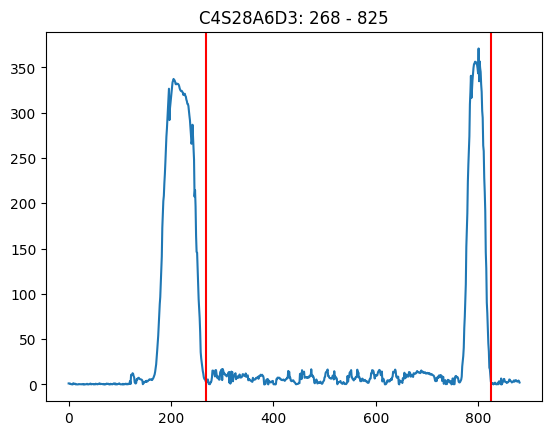

In [29]:
from glob import glob
import json
import pandas as pd

root_path = 'path/to/your/root/'

files = glob(f'{root_path}data/data_yolo/frames/C*/S*/.json')

files = files[:1]

data = []

for file in files:
    print(file)
    if 'A0' in file:
        continue
    if 'S1A1D1' in file:
        continue
    with open(file, 'r') as f:
        frames = json.load(f)
        frames = sorted(frames, key=lambda x: int(x['file'].split('_')[-1].split('.')[0]))
    # frames = frames[:400]+frames[-400:]
    right_foot_points = []
    for frame in frames:
        if frame['num_people'] == 0:
            right_foot_points.append(None)
        if frame['keypoints'][0][0][16][2] > 0.8:
            right_foot_points.append(frame['keypoints'][0][0][16][1])
        else:
            right_foot_points.append(None)
    avg_first_10 = sum(right_foot_points[:10])/10
    diffs = [abs(y-avg_first_10) for y in right_foot_points]

    low = 5
    high_thres = 100
    flag_high = False
    first_idx = None
    last_idx = None
    for diff in diffs:
        if diff > high_thres:
            flag_high = True
        if flag_high & (diff < low):
            first_idx = diffs.index(diff)
            break
    # get last foot down point
    avg_first_10 = sum(right_foot_points[-10:])/10
    diffs = [abs(y-avg_first_10) for y in right_foot_points]
    last_high_idx = None
    for diff in diffs:
        if diff > high_thres:
            last_high_idx = diffs.index(diff)
    for diff in diffs[last_high_idx:]:
        if diff < low:
            last_idx = diffs.index(diff)
            break

    avg_first_10 = sum(right_foot_points[:10])/10
    diffs = [abs(y-avg_first_10) for y in right_foot_points]

    print(first_idx)
    print(last_idx)

    path = f'{root_path}data/graphs/{file.split("/")[-1].replace(".json", "")}.png'
    data.append({'combintation': file.split("/")[-1].replace(".json", ""), 'first_idx': first_idx, 'last_idx': last_idx, 'path': path})
    #plot diffs over index
    import matplotlib.pyplot as plt
    plt.plot(diffs)
    # add title
    plt.title(f'{file.split("/")[-1].replace(".json", "")}: {first_idx} - {last_idx}')
    if first_idx is not None:
        plt.axvline(first_idx, color='r')
    if last_idx is not None:
        plt.axvline(last_idx, color='r')
    # save graph
    # plt.savefig(path)
    plt.show()

df = pd.DataFrame(data)
df.to_csv(f'{root_path}data/stomps.csv', index=False)



1280 2665


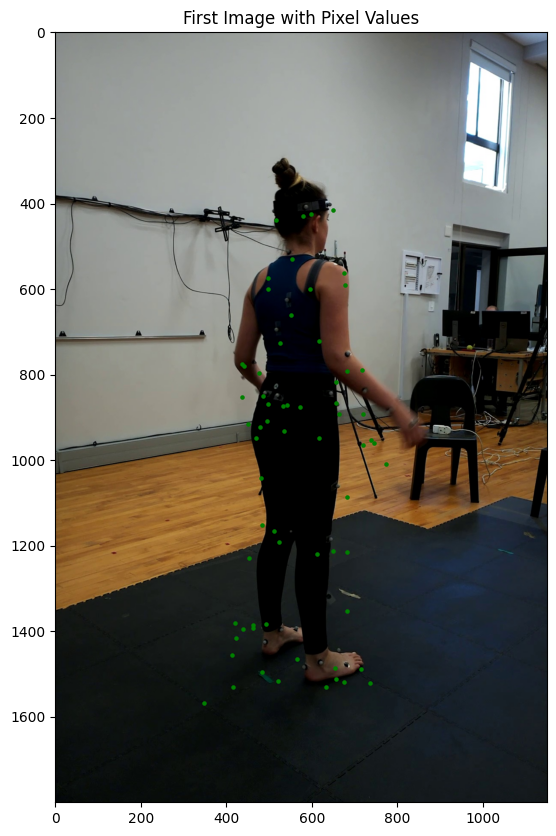

In [28]:
import os
import json
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Define combination and extract camera and subject information
combination = 'C1S1A9D3'
cam = combination.split('S')[0]
subject = f'S{combination.split("S")[1].split("A")[0]}'

# Read the 3D stomp data
df_3d_stomp = pd.read_csv(f'{root_path}data/stomps_3d.csv')

# Read the frame data from the JSON file
with open(f'{root_path}internal_data/C4/{subject}/{combination.replace(cam, "")}.json', 'r') as f:
    frames = json.load(f)

# Read the stomp refinement data
with open(f'{root_path}data/stomp_refine_manual.json', 'r') as f:
    stomp_refine = json.load(f)

# Extract the relevant refinement data for the combination
stomp_refine = stomp_refine[combination.replace(cam, 'C4')]
image_first = stomp_refine['first_idx']
image_last = stomp_refine['last_idx']

# Filter the 3D stomp data for the specific combination
df_temp = df_3d_stomp[df_3d_stomp['combintation'] == combination.replace(cam, '')]
vicon_first_idx = df_temp['first_idx'].values[0]
vicon_last_idx = df_temp['last_idx'].values[0]
print(vicon_first_idx, vicon_last_idx)

# Extract the skeleton and wand pixel values
skel_pixel = frames[vicon_first_idx+8]['xy']
wand_pixel = frames[vicon_first_idx+8]['wand_xy']
pixel_vals = skel_pixel + wand_pixel

#/media/chris/T7/data_processed/frames/C4/S1/C4S1A1D2

# Define paths to the first and last images
image_path_first = f'{root_path}frames/C4/{subject}/{combination.replace(cam, "C4")}/{combination.replace(cam, "C4")}_{str(image_first).zfill(4)}.jpg'
image_path_last = f'{root_path}frames/C4/{subject}/{combination.replace(cam, "C4")}/{combination.replace(cam, "C4")}_{str(image_last).zfill(4)}.jpg'

# Read and plot the first image
# image = cv2.imread('/media/chris/T7/data_processed/frames/C4/S1/C4S1A0D1/C4S1A0D1_0157.jpg')
image = cv2.imread(image_path_first)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert image from BGR to RGB

# Extract x and y coordinates from pixel_vals
x_vals = [coord[0] for coord in pixel_vals]
y_vals = [coord[1] for coord in pixel_vals]

# Plot the image and pixel values
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.scatter(x_vals, y_vals, c='green', marker='o', s=5)
plt.title('First Image with Pixel Values')
plt.show()


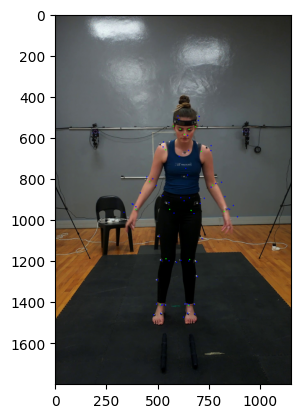

In [10]:
import json
import pandas as pd
from datetime import datetime
from fastprogress import progress_bar
import cv2
import matplotlib.pyplot as plt

# Load JSON and CSV data
with open(f'{root_path}data/stomp_sync_init.json', 'r') as f:
    stomp_sync_init_all = json.load(f)

with open(f'{root_path}data/stomp_3d_manual.json', 'r') as f:
    stomp_3d_manual = json.load(f)

stomp_sync_init_all = {
    "C1S1A6D2": stomp_sync_init_all['C1S1A6D2']
}

new_dict = {}

for key, val in progress_bar(stomp_sync_init_all.items(), total=len(stomp_sync_init_all)):
    first_idx_w_drop = val['first_idx_w_drop']
    last_idx_w_drop = val['last_idx_w_drop']
    first_idx = val['first_idx']
    last_idx = val['last_idx']
    combination = key
    group_id = key[2:]
    cam = key[:2]
    subject = f"{group_id.split('A')[0]}"
    if cam == 'C4':
        continue
    c4_start_idx = stomp_3d_manual[f'C4{group_id}']['first_idx']
    internal_path = f'{root_path}internal_data/{cam}/{subject}/{group_id}.json'
    with open(internal_path, 'r') as f:
        internal_frames = json.load(f)
    yolo_path = f'{root_path}data/data_yolo/frames/{cam}/{subject}/{combination}.json'
    with open(yolo_path, 'r') as f:
        yolo_frames = json.load(f)
    internal_frames = internal_frames[c4_start_idx-4:c4_start_idx+4]
    yolo_frames = yolo_frames[first_idx-4:first_idx+5]
    idxs = [i for i in range(first_idx-4, first_idx+5)]
    for i, (internal_frame, yolo_frame, idx) in enumerate(zip(internal_frames, yolo_frames, idxs)):
        img_path = f'{root_path}frames/{cam}/{subject}/{combination}/{combination}_{str(idx).zfill(4)}.jpg'
        internal_points = internal_frame['point_ids']
        internal_xy = internal_frame['xy']
        yolo_xy = yolo_frame['keypoints'][0][0]
        yolo_xy = [coord[:2] for coord in yolo_xy]
        #plot points on image
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        for point in internal_xy:
            #if not type int
            try:
                x, y = point
                cv2.circle(image, (int(x), int(y)), 3, (0, 0, 255), -1)
            except:
                continue
        for point in yolo_xy:
            x, y = point
            cv2.circle(image, (int(x), int(y)), 3, (0, 255, 0), -1)
        plt.imshow(image)

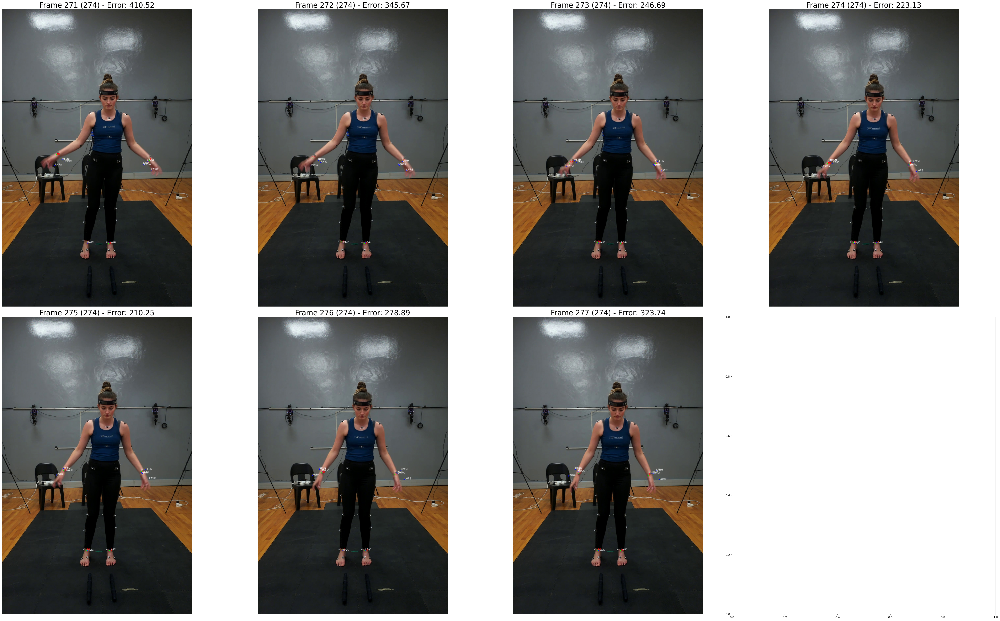

In [37]:
import json
import pandas as pd
from datetime import datetime
from fastprogress import progress_bar
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load JSON and CSV data
with open(f'{root_path}data/stomp_sync_init.json', 'r') as f:
    stomp_sync_init_all = json.load(f)

with open(f'{root_path}data/stomp_3d_manual.json', 'r') as f:
    stomp_3d_manual = json.load(f)

stomp_sync_init_all = {
    "C1S1A6D2": stomp_sync_init_all['C1S1A6D2']
}

new_dict = {}

fig, axs = plt.subplots(2, 4, figsize=(50, 30))
axs = axs.flatten()

plot_idx = 0

for key, val in progress_bar(stomp_sync_init_all.items(), total=len(stomp_sync_init_all)):
    first_idx_w_drop = val['first_idx_w_drop']
    last_idx_w_drop = val['last_idx_w_drop']
    first_idx = val['first_idx']
    last_idx = val['last_idx']
    combination = key
    group_id = key[2:]
    cam = key[:2]
    subject = f"{group_id.split('A')[0]}"
    if cam == 'C4':
        continue
    c4_start_idx = stomp_3d_manual[f'C4{group_id}']['first_idx']
    internal_path = f'{root_path}internal_data/{cam}/{subject}/{group_id}.json'
    with open(internal_path, 'r') as f:
        internal_frames = json.load(f)
    yolo_path = f'{root_path}data/data_yolo/frames/{cam}/{subject}/{combination}.json'
    with open(yolo_path, 'r') as f:
        yolo_frames = json.load(f)
    internal_frames = internal_frames[c4_start_idx-3:c4_start_idx+4]
    yolo_frames = yolo_frames[first_idx-3:first_idx+4]
    idxs = [i for i in range(first_idx-3, first_idx+4)]
    best_idx = first_idx
    best_error = 100000
    for i, (internal_frame, yolo_frame, idx) in enumerate(zip(internal_frames, yolo_frames, idxs)):
        img_path = f'{root_path}frames/{cam}/{subject}/{combination}/{combination}_{str(idx).zfill(4)}.jpg'
        internal_points = internal_frame['point_ids']
        internal_xy = internal_frame['xy']
        yolo_xy = yolo_frame['keypoints'][0][0]
        yolo_xy = [coord[:2] for coord in yolo_xy]

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        error_total = 0
        err_cnt = 0
        for int_i, yolo_i in zip(['LWJC', 'LWRA', 'LFRM', 'LWRB', 'RWJC', 'RWRA', 'RFRM', 'RELB', 'LAJC', 'RAJC', 'RFHD', 'LFHD'], [9, 9, 9, 9, 10, 10, 10, 10, 15, 16, 4, 3]):
            idx_temp = internal_points.index(int_i)
            int_temp = internal_xy[idx_temp]
            yolo_temp = yolo_xy[yolo_i]
            error_total += np.sqrt((int_temp[0] - yolo_temp[0])**2 + (int_temp[1] - yolo_temp[1])**2)
            err_cnt += 1
            avg_error = error_total / err_cnt
            cv2.circle(image, (int(int_temp[0]), int(int_temp[1])), 3, (0, 0, 255), -1)
            cv2.circle(image, (int(yolo_temp[0]), int(yolo_temp[1])), 3, (0, 255, 0), -1)
            cv2.putText(image, f'{int_i}', (int(int_temp[0]), int(int_temp[1])), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
            cv2.putText(image, f'{yolo_i}', (int(yolo_temp[0]), int(yolo_temp[1])), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1, cv2.LINE_AA)

        if avg_error < best_error:
            best_error = avg_error
            best_idx = idx
        
        axs[plot_idx].imshow(image)
        axs[plot_idx].axis('off')
        axs[plot_idx].set_title(f'Frame {idx} ({first_idx}) - Error: {error_total:.2f}', fontsize=25)
        plot_idx += 1
        
        if plot_idx >= 8:  # Only plot 8 images
            break

    if plot_idx >= 8:
        break

    #save fig
    os.makedirs(f'{root_path}data/sync_cams_stomps/{cam}/{subject}', exist_ok=True)
    plt.savefig(f'{root_path}data/sync_cams_stomps/{cam}/{subject}/{key}.png')

    new_dict[key] = best_idx
    with open(f'{root_path}data/stomp_sync_refine.json', 'w') as f:
        json.dump(new_dict, f, indent=4)



In [ ]:
/home/chris/Desktop/Masters/Stereo Paper/code/data_process/data_yolo/frames/C1/S1/C1S1A6D2.json

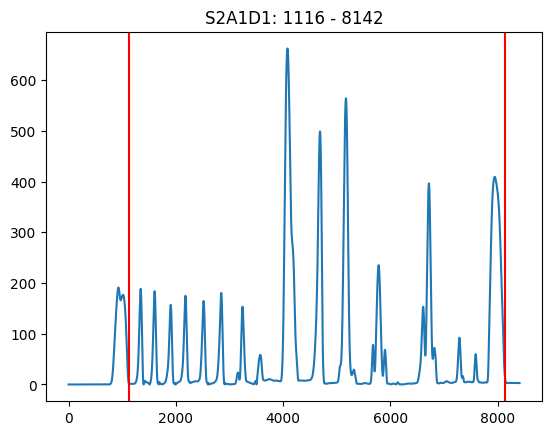

In [8]:
from glob import glob
import json
import pandas as pd
from fastprogress import progress_bar
import os

df_path = f'{root_path}data/stomps_3d.csv'
if os.path.exists(df_path):
    df_done = pd.read_csv(df_path)

files = glob(f'{root_path}WCS/S2/S2A1*.json')

files = files[:1]

data = []

for file in progress_bar(files):
    if 'A0' in file:
        continue
    if 'S1A' in file:
        continue
    with open(file, 'r') as f:
        frames = json.load(f)
    right_foot_points = []
    prev = 0
    for frame in frames:
        point_ids = frame['point_ids']
        foot_id = 'RTIB'
        if foot_id not in point_ids:
            right_foot_points.append(prev)
        else:
            foot_idx = point_ids.index(foot_id)
            xyz = frame['xyz']
            if xyz[foot_idx][1]:
                right_foot_points.append(xyz[foot_idx][1])
            else:
                right_foot_points.append(prev)
    avg_first_10 = sum(right_foot_points[:10])/10
    diffs = [abs(y-avg_first_10) for y in right_foot_points]
    # diffs = right_foot_points

    low = 5
    high_thres = 100
    flag_high = False
    first_idx = None
    last_idx = None
    for diff in diffs:
        if diff > high_thres:
            flag_high = True
        if flag_high & (diff < low):
            first_idx = diffs.index(diff)
            break
    # get last foot down point
    avg_first_10 = sum(right_foot_points[-10:])/10
    diffs = [abs(y-avg_first_10) for y in right_foot_points]
    # diffs = right_foot_points
    last_high_idx = None
    for diff in diffs:
        if diff > high_thres:
            last_high_idx = diffs.index(diff)
    for diff in diffs[last_high_idx:]:
        if diff < low:
            last_idx = diffs.index(diff)
            break

    avg_first_10 = sum(right_foot_points[:10])/10
    diffs = [abs(y-avg_first_10) for y in right_foot_points]
    # diffs = right_foot_points

    path = f'{root_path}data/graphs_3d/{file.split("/")[-1].replace(".json", "")}.png'
    data.append({'combintation': file.split("/")[-1].replace(".json", ""), 'first_idx': first_idx, 'last_idx': last_idx, 'path': path})
    #plot diffs over index
    import matplotlib.pyplot as plt
    plt.plot(diffs)
    # add title
    plt.title(f'{file.split("/")[-1].replace(".json", "")}: {first_idx} - {last_idx}')
    if first_idx is not None:
        plt.axvline(first_idx, color='r')
    if last_idx is not None:
        plt.axvline(last_idx, color='r')
    # save graph
    plt.show()
